In [2]:
import fastdtw
from fastdtw import fastdtw
from scipy.spatial.distance import euclidean

import datetime

import numpy as np
import pandas as pd

import matplotlib.pyplot as plt

from src.dataset.session_data_manager import SessionDataManager
from src.dataset.sensor_readings import SensorReadings

/home/bulat/anaconda3/envs/trdl-ai/lib/python3.10/site-packages/tslearn/bases/bases.py:15: UserWarning: h5py not installed, hdf5 features will not be supported.
Install h5py to use hdf5 features: http://docs.h5py.org/
  warn(h5py_msg)


# Summary:

In [3]:
data_path = './demo_data//'

sdm = SessionDataManager(data_path)

In [4]:
summary = sdm.get_summary()
summary_shorten = sdm.get_summary(drop_extra=True)
summary_shorten

,user,session_id,activity,position,os,model,duration_dt,duration_sec,readings,expected_freq,devices,num_devices,approx_freq
0,Denys,Denys-1678984942178,CYCLING,JERSEY_POCKET,ANDROID,OnePlus KB2003,0 days 00:15:10.294000,910.294,51750,33.333333,"[ACCELEROMETER, GYROSCOPE, MAGNETOMETER]",3,27.08
1,Denys,Denys-1678820143565,CYCLING,"[BACKPACK, HANDLEBAR, HANDLEBAR_BAG, FRAME_BAG]",ANDROID,OnePlus KB2003,0 days 00:11:43.855000,703.855,39750,33.333333,"[ACCELEROMETER, GYROSCOPE, MAGNETOMETER]",3,18.82
2,amagross,amagross-1678197921764,CYCLING,JERSEY_POCKET,ANDROID,Xiaomi Redmi Note 8T,0 days 00:10:17.759000,617.759,36000,33.333333,"[ACCELEROMETER, MAGNETOMETER, GYROSCOPE]",3,19.75
3,Denys,Denys-1678721916885,DRIVING,"[BACKPACK, HANDLEBAR, HANDLEBAR_BAG, FRAME_BAG...",ANDROID,OnePlus KB2003,0 days 00:12:11.434000,731.434,41625,33.333333,"[ACCELEROMETER, GYROSCOPE, MAGNETOMETER]",3,18.97
4,Malovanyi2012,Malovanyi2012-1679165568546,CYCLING,JERSEY_POCKET,ANDROID,OnePlus AC2003,0 days 00:12:43.889000,763.889,3375,33.333333,"[ACCELEROMETER, GYROSCOPE, MAGNETOMETER]",3,1.47
5,Denys2,Denys2-1679052295527,CYCLING,PANTS_POCKET,ANDROID,Xiaomi 220333QNY,0 days 00:11:49.591000,709.591,11625,33.333333,[ACCELEROMETER],1,16.38
6,Denys2,Denys2-1678802891369,WALKING,"[BACKPACK, HANDLEBAR, HANDLEBAR_BAG, FRAME_BAG]",ANDROID,Xiaomi 220333QNY,0 days 00:10:36.907000,636.907,5250,33.333333,[ACCELEROMETER],1,9.74
7,Denys2,Denys2-1678897625631,CYCLING,BACKPACK,ANDROID,Xiaomi 220333QNY,0 days 00:13:06.666000,786.666,13125,33.333333,[ACCELEROMETER],1,16.68
8,amagross,amagross-1678200029611,WALKING,"[BACKPACK, HANDLEBAR, HANDLEBAR_BAG, FRAME_BAG]",ANDROID,Xiaomi Redmi Note 8T,0 days 00:12:14.261000,734.261,42375,33.333333,"[ACCELEROMETER, MAGNETOMETER, GYROSCOPE]",3,21.44
9,amagross,amagross-1678198625230,CYCLING,"[BACKPACK, HANDLEBAR, HANDLEBAR_BAG, FRAME_BAG]",ANDROID,Xiaomi Redmi Note 8T,0 days 00:10:08.628000,608.628,34875,33.333333,"[ACCELEROMETER, MAGNETOMETER, GYROSCOPE]",3,18.9


In [5]:
summary_freq_dev = summary_shorten[['session_id', 'os', 'model', 'expected_freq', 'approx_freq', 'activity', 'num_devices', 'devices']].sort_values(by=['model'], ascending=False).reset_index(drop=True)
summary_freq_dev[summary_freq_dev['approx_freq']<15]

,session_id,os,model,expected_freq,approx_freq,activity,num_devices,devices
18,Denys2-1679053171742,ANDROID,Xiaomi 220333QNY,33.333333,1.22,CYCLING,1,[ACCELEROMETER]
21,Denys2-1678802891369,ANDROID,Xiaomi 220333QNY,33.333333,9.74,WALKING,1,[ACCELEROMETER]
39,Denys-1678818404111,ANDROID,OnePlus KB2003,33.333333,1.01,CYCLING,3,"[ACCELEROMETER, GYROSCOPE, MAGNETOMETER]"
46,Malovanyi2012-1679164323486,ANDROID,OnePlus AC2003,33.333333,5.82,CYCLING,3,"[ACCELEROMETER, GYROSCOPE, MAGNETOMETER]"
47,Malovaniy1979-1679164788836,ANDROID,OnePlus AC2003,33.333333,1.42,CYCLING,3,"[GYROSCOPE, MAGNETOMETER, ACCELEROMETER]"
48,Malovaniy1979-1679166354680,ANDROID,OnePlus AC2003,33.333333,4.28,CYCLING,3,"[GYROSCOPE, MAGNETOMETER, ACCELEROMETER]"
49,Malovanyi2012-1679165568546,ANDROID,OnePlus AC2003,33.333333,1.47,CYCLING,3,"[ACCELEROMETER, GYROSCOPE, MAGNETOMETER]"


In [6]:
ts_summary = {}
for index, row in summary.iterrows():
    sessionId = row['session_id']
    recording_path = row['data']
    curr_sr = SensorReadings(sessionId, recording_path, avg_duplicate_ts=True)
    ts_summary[sessionId] = curr_sr.get_ts_summary()

/home/bulat/trdl_ai_exp/dataset/sensor_readings.py:34: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  sensor_data_ts = sensor_data_ts.groupby('timestamp').mean().reset_index()
/home/bulat/trdl_ai_exp/dataset/sensor_readings.py:34: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  sensor_data_ts = sensor_data_ts.groupby('timestamp').mean().reset_index()
/home/bulat/trdl_ai_exp/dataset/sensor_readings.py:34: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should

/home/bulat/trdl_ai_exp/dataset/sensor_readings.py:34: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  sensor_data_ts = sensor_data_ts.groupby('timestamp').mean().reset_index()
/home/bulat/trdl_ai_exp/dataset/sensor_readings.py:34: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  sensor_data_ts = sensor_data_ts.groupby('timestamp').mean().reset_index()
/home/bulat/trdl_ai_exp/dataset/sensor_readings.py:34: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should

/home/bulat/trdl_ai_exp/dataset/sensor_readings.py:34: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  sensor_data_ts = sensor_data_ts.groupby('timestamp').mean().reset_index()
/home/bulat/trdl_ai_exp/dataset/sensor_readings.py:34: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  sensor_data_ts = sensor_data_ts.groupby('timestamp').mean().reset_index()
/home/bulat/trdl_ai_exp/dataset/sensor_readings.py:34: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should

/home/bulat/trdl_ai_exp/dataset/sensor_readings.py:34: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  sensor_data_ts = sensor_data_ts.groupby('timestamp').mean().reset_index()
/home/bulat/trdl_ai_exp/dataset/sensor_readings.py:34: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  sensor_data_ts = sensor_data_ts.groupby('timestamp').mean().reset_index()
/home/bulat/trdl_ai_exp/dataset/sensor_readings.py:34: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should

/home/bulat/trdl_ai_exp/dataset/sensor_readings.py:34: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  sensor_data_ts = sensor_data_ts.groupby('timestamp').mean().reset_index()
/home/bulat/trdl_ai_exp/dataset/sensor_readings.py:34: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  sensor_data_ts = sensor_data_ts.groupby('timestamp').mean().reset_index()
/home/bulat/trdl_ai_exp/dataset/sensor_readings.py:34: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should

In [7]:
ts_summary_df = pd.DataFrame.from_dict({(i,j): ts_summary[i][j] 
                           for i in ts_summary.keys() 
                           for j in ts_summary[i].keys()},
                       orient='index').reset_index()
ts_summary_df = ts_summary_df.rename(columns = {'level_0':'session_id', 'level_1': 'sensor'}).sort_values(by=['session_id'], ascending=False).reset_index(drop=True)

In [8]:
merged = ts_summary_df.merge(summary, on='session_id', how='left')

In [9]:
ts_sum_columns = list(ts_summary_df.columns)
ts_sum_columns.extend(['model', 'activity'])
merged[ts_sum_columns].sort_values(by=['model', 'session_id'], ascending=False).reset_index(drop=True)

,session_id,sensor,Repeating timestamps (%),Overall timestamps,Repeating timestamps,Mean effective frequency,Mean update interval,model,activity
0,amagross-1678781534238,MAGNETOMETER,0.0,10383,0,16.688,59.925,Xiaomi Redmi Note 8T,RUNNING
1,amagross-1678781534238,GYROSCOPE,0.0,10780,0,17.329,57.705,Xiaomi Redmi Note 8T,RUNNING
2,amagross-1678781534238,ACCELEROMETER,0.0,14358,0,23.074,43.339,Xiaomi Redmi Note 8T,RUNNING
3,amagross-1678780881300,GYROSCOPE,0.0,10686,0,17.762,56.301,Xiaomi Redmi Note 8T,WALKING
4,amagross-1678780881300,MAGNETOMETER,0.0,10060,0,16.718,59.815,Xiaomi Redmi Note 8T,WALKING
...,...,...,...,...,...,...,...,...,...
117,Malovaniy1979-1679166354680,MAGNETOMETER,0.0,2462,0,4.071,245.644,OnePlus AC2003,CYCLING
118,Malovaniy1979-1679166354680,GYROSCOPE,0.0,2482,0,4.104,243.669,OnePlus AC2003,CYCLING
119,Malovaniy1979-1679164788836,GYROSCOPE,0.0,853,0,1.387,721.094,OnePlus AC2003,CYCLING
120,Malovaniy1979-1679164788836,MAGNETOMETER,0.0,845,0,1.374,727.891,OnePlus AC2003,CYCLING


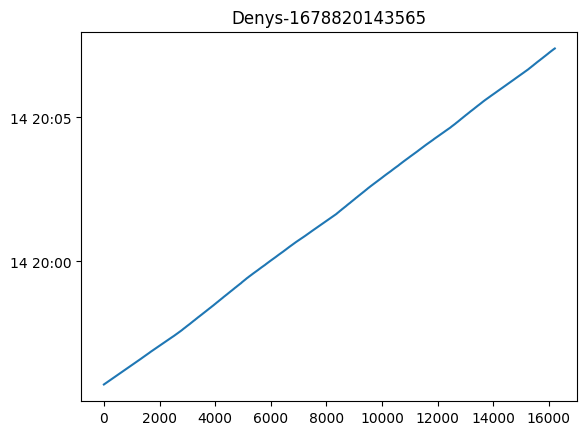

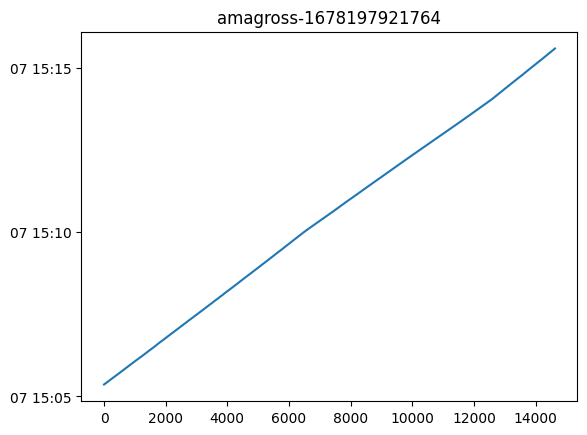

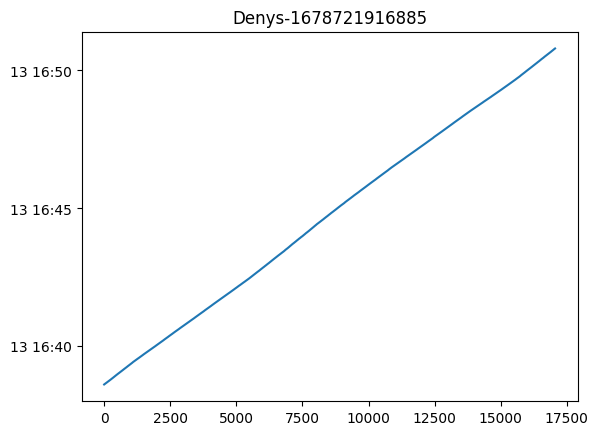

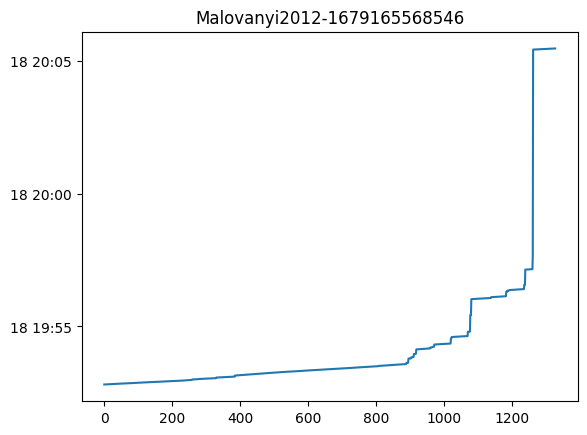

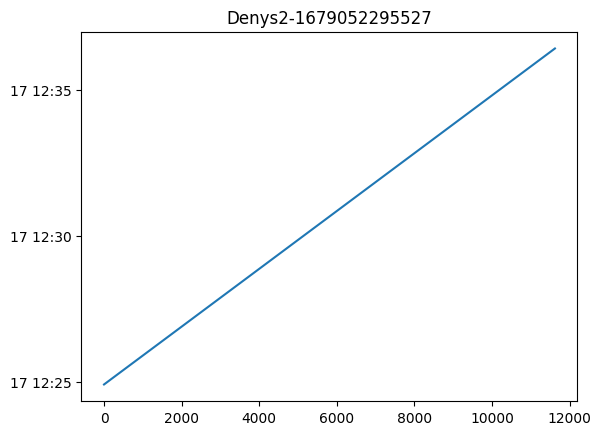

...

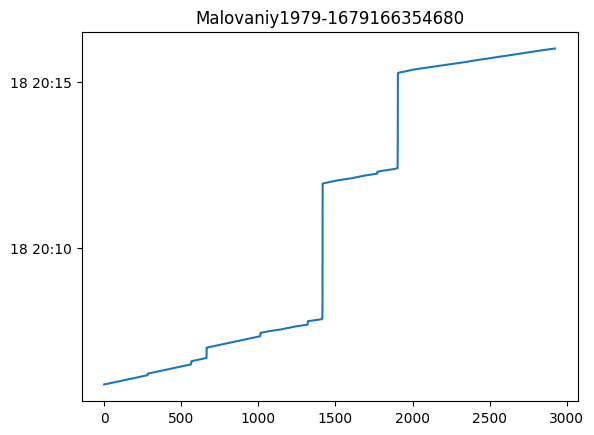

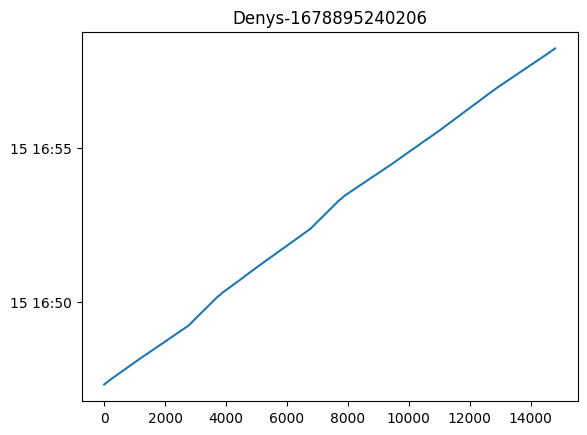

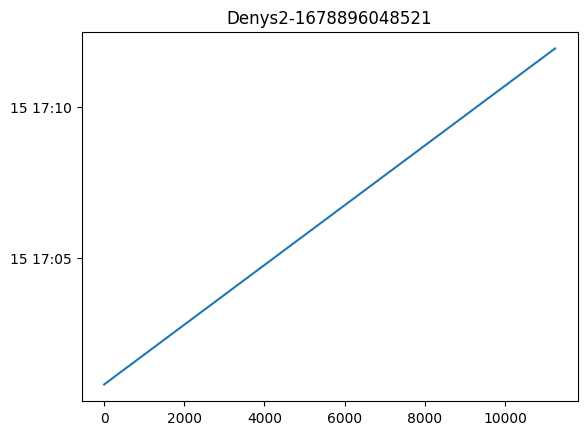

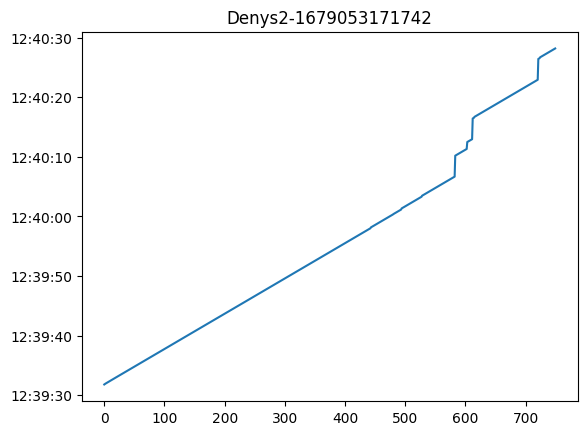

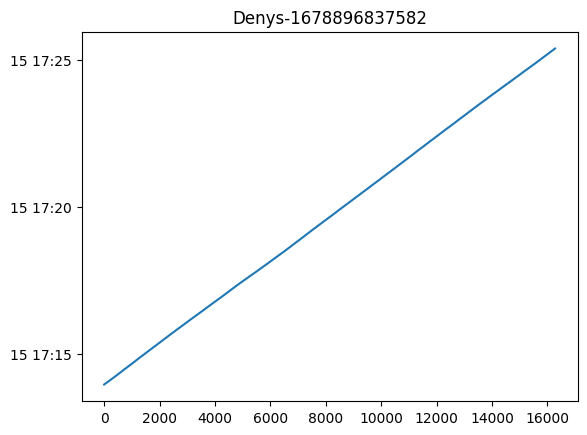

In [17]:
for i, row in summary[summary['approx_freq']<20].iterrows():
    curr_sr = SensorReadings(row['session_id'], row['data'], row['activity'], row['position'], row['model'])
    plt.plot(curr_sr.device_data['ACCELEROMETER']['dt'])
    plt.title(row['session_id'])
    plt.show()

In [10]:

merged[merged['session_id'] == 'Malovaniy1979-1679164788836']
curr_sr = SensorReadings('Denys-1678818404111', './test_data_new_collection_30hz/Denys-1678818404111-sensor-readings.csv', 'CYCLING', 'PANTS_POCKET', 'OnePlus KB2003')
plt.plot(curr_sr.device_data['ACCELEROMETER']['dt'])
plt.title('Denys-1678818404111')

,session_id,sensor,Repeating timestamps (%),Overall timestamps,Repeating timestamps,Mean effective frequency,Mean update interval,user,activity,position,...,duration_sec,readings,expected_freq,metadata,start_dt,end_dt,data,devices,num_devices,approx_freq
48,Malovaniy1979-1679164788836,GYROSCOPE,0.0,853,0,1.387,721.094,Malovaniy1979,CYCLING,PANTS_POCKET,...,614.983,2625,33.333333,./test_data_new_collection_30hz/Malovaniy1979-...,2023-03-18T18:39:48.836Z,2023-03-18T18:50:03.819Z,./test_data_new_collection_30hz/Malovaniy1979-...,"[GYROSCOPE, MAGNETOMETER, ACCELEROMETER]",3,1.42
49,Malovaniy1979-1679164788836,MAGNETOMETER,0.0,845,0,1.374,727.891,Malovaniy1979,CYCLING,PANTS_POCKET,...,614.983,2625,33.333333,./test_data_new_collection_30hz/Malovaniy1979-...,2023-03-18T18:39:48.836Z,2023-03-18T18:50:03.819Z,./test_data_new_collection_30hz/Malovaniy1979-...,"[GYROSCOPE, MAGNETOMETER, ACCELEROMETER]",3,1.42
50,Malovaniy1979-1679164788836,ACCELEROMETER,0.0,923,0,1.501,666.280,Malovaniy1979,CYCLING,PANTS_POCKET,...,614.983,2625,33.333333,./test_data_new_collection_30hz/Malovaniy1979-...,2023-03-18T18:39:48.836Z,2023-03-18T18:50:03.819Z,./test_data_new_collection_30hz/Malovaniy1979-...,"[GYROSCOPE, MAGNETOMETER, ACCELEROMETER]",3,1.42


Text(0.5, 1.0, 'Denys-1678818404111')

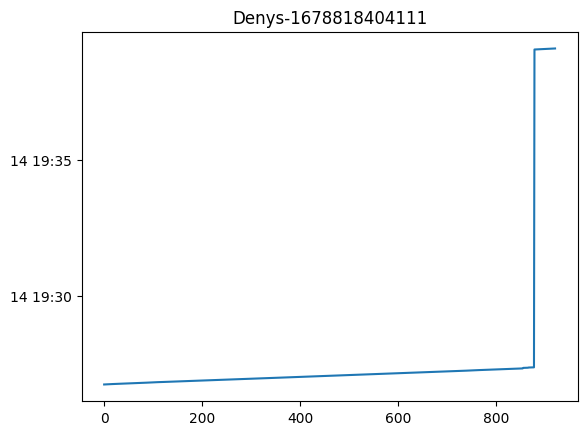

# Visualize data

Denys-1678820143565


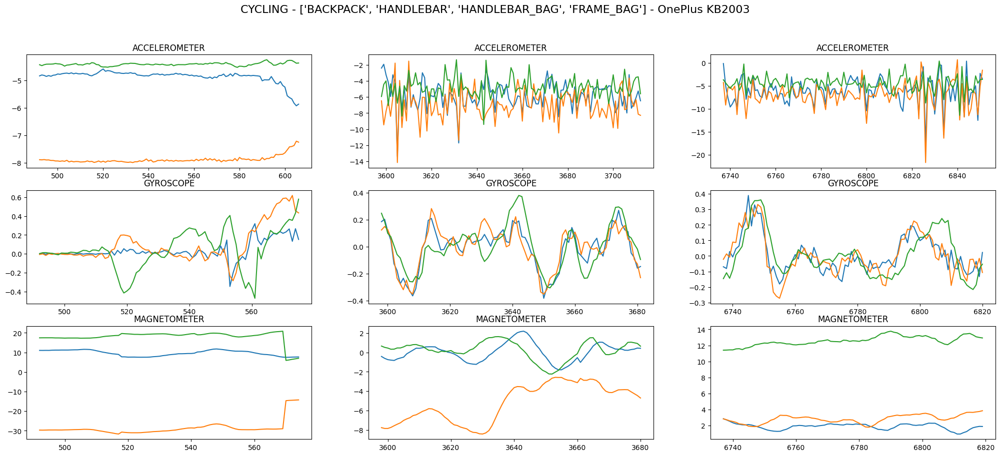

amagross-1678197921764


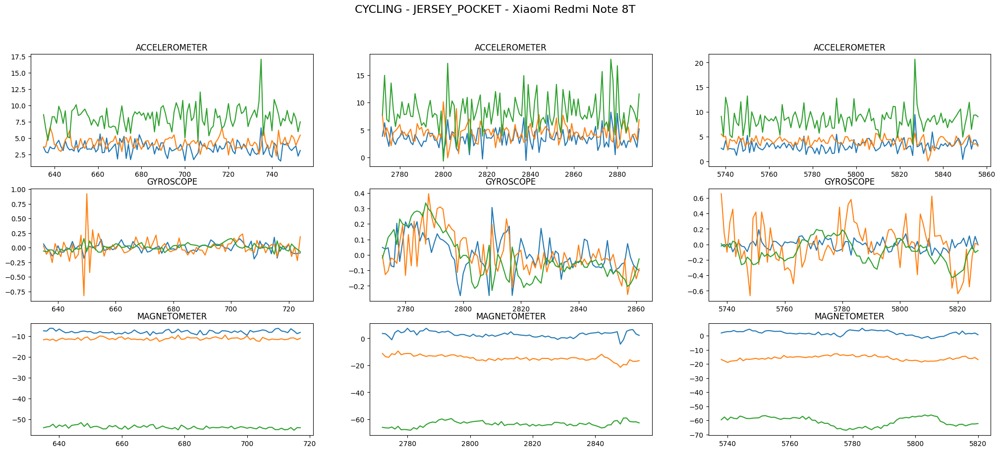

Denys2-1678802891369


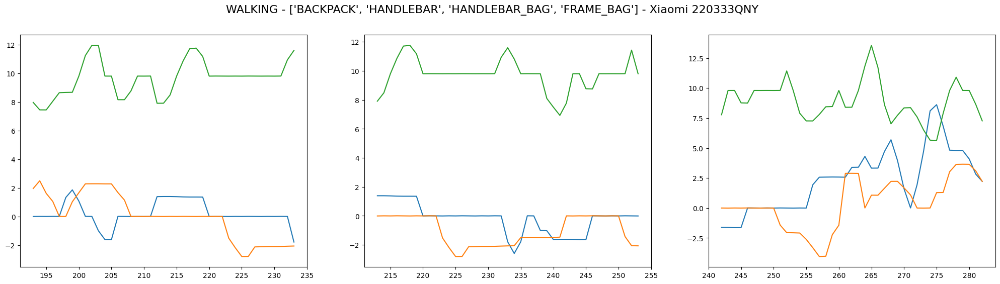

Denys2-1678897625631


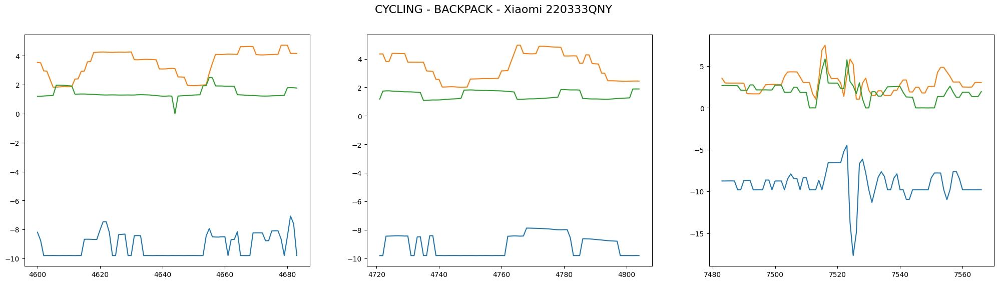

amagross-1678200029611


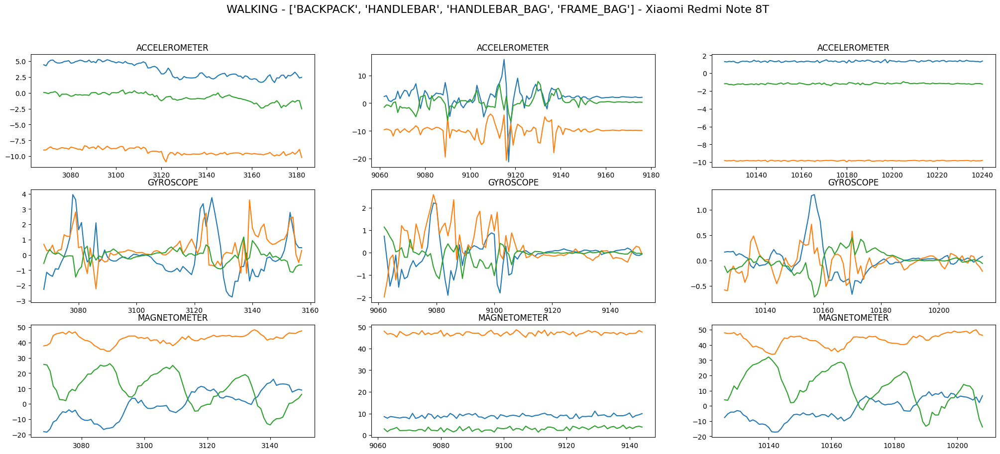

amagross-1678198625230


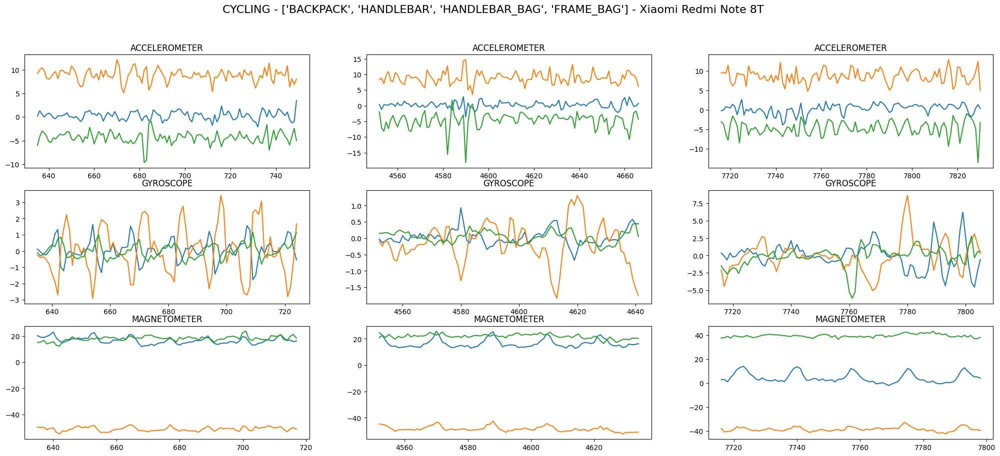

Denys2-1678820144221


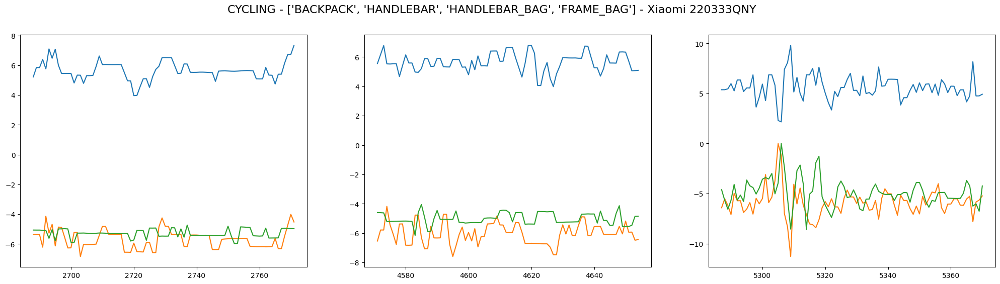

Denys2-1678896838304


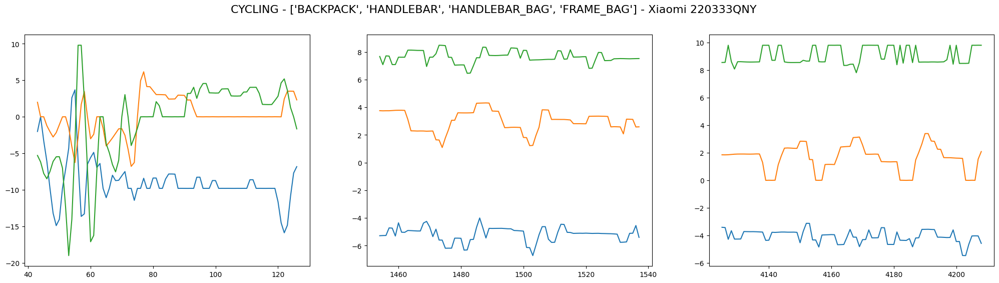

Denys2-1678800177052


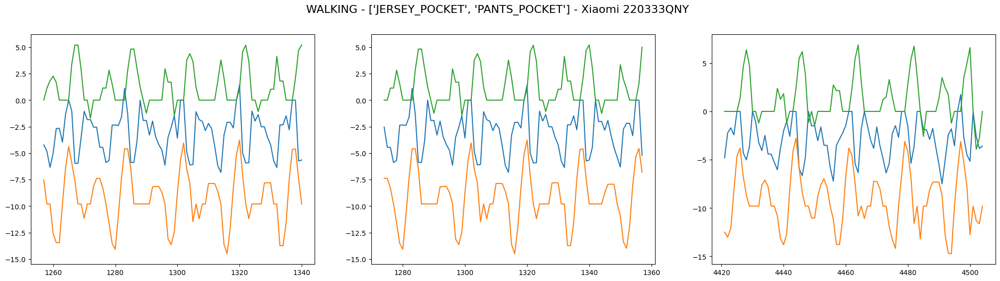

Denys-1678802893232


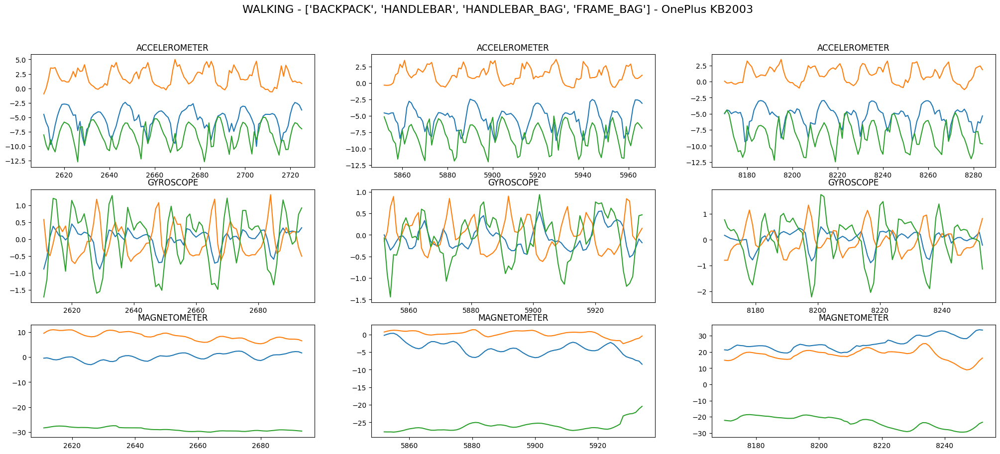

Denys2-1678819340285


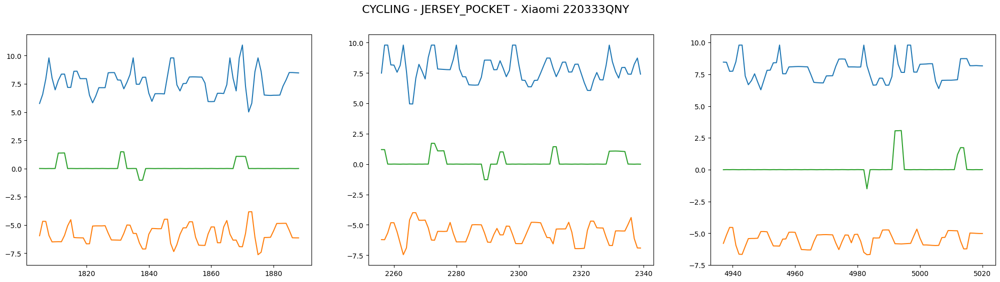

Denys-1678819337695


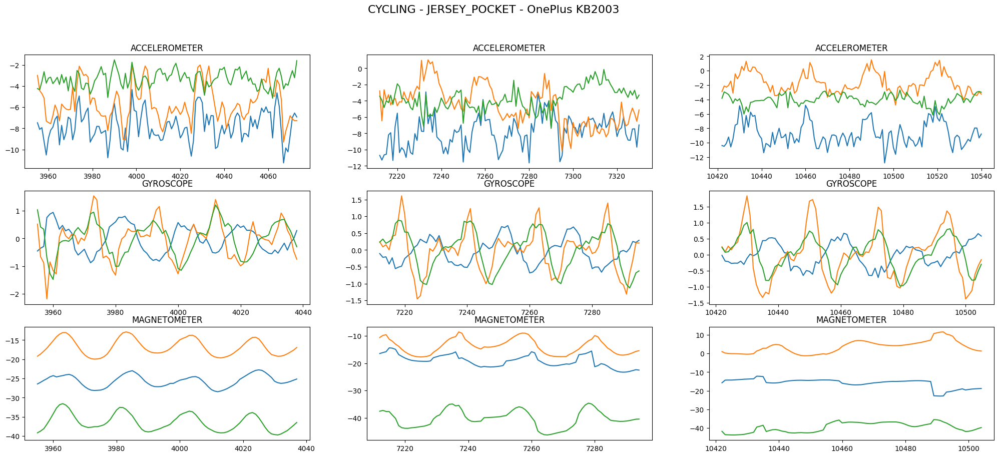

amagross-1678718063872


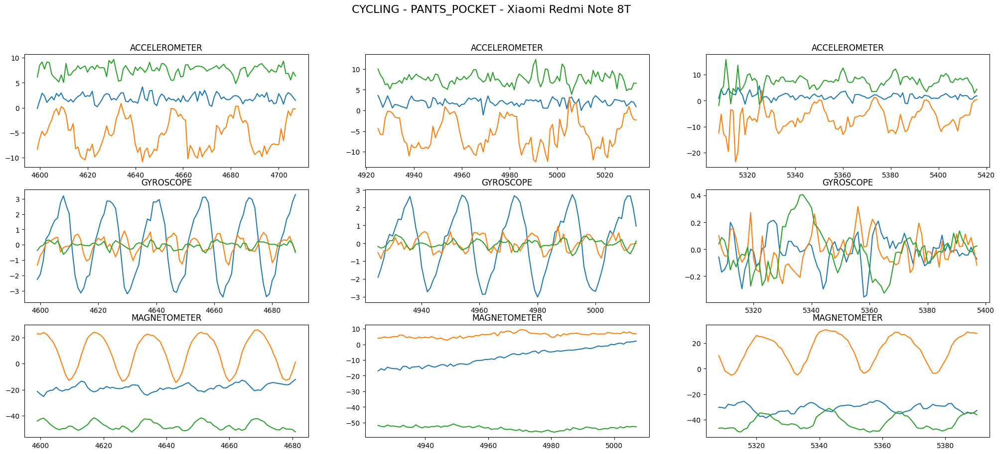

amagross-1678781534238


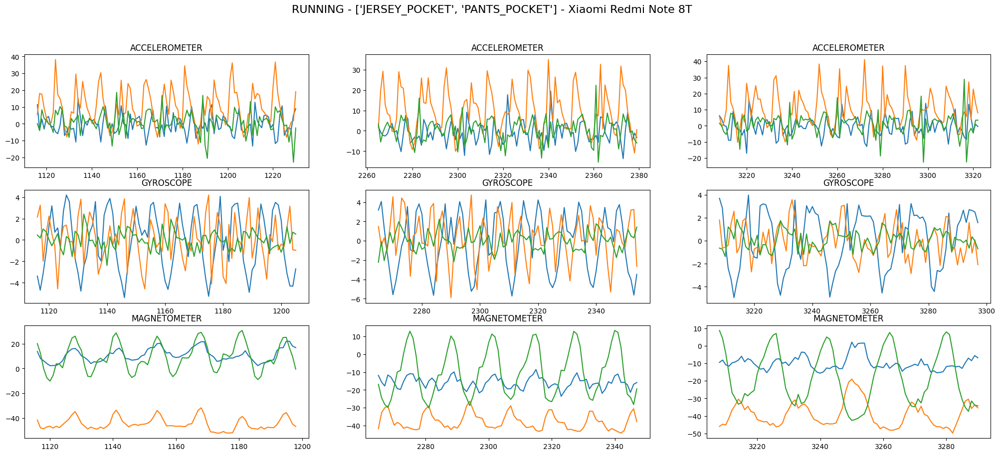

Denys-1678897625251


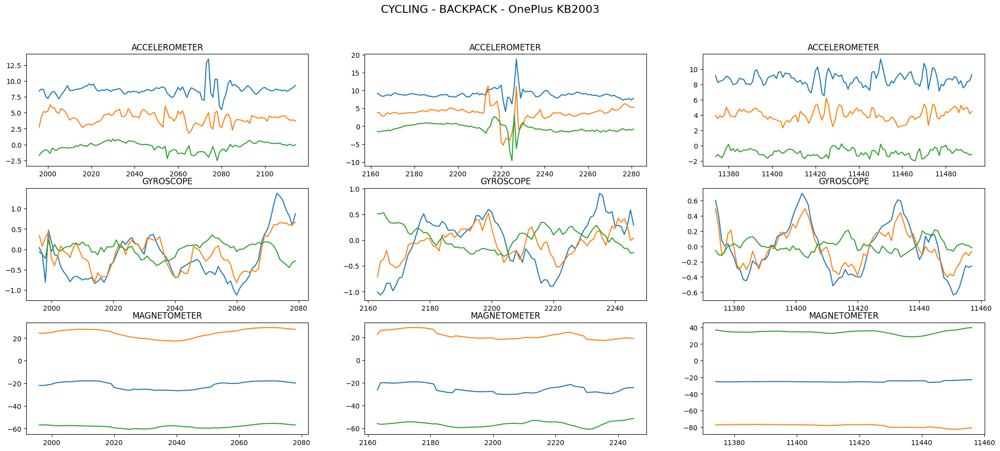

amagross-1678715188011


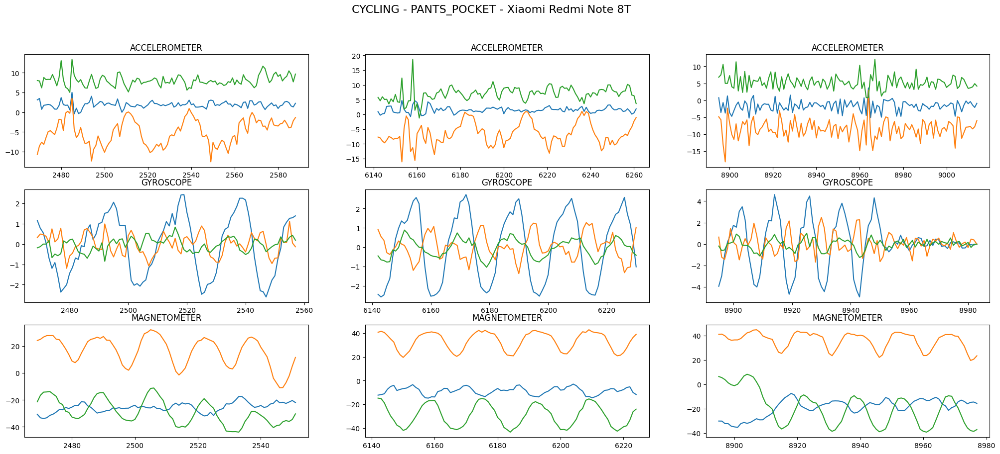

amagross-1678197254044


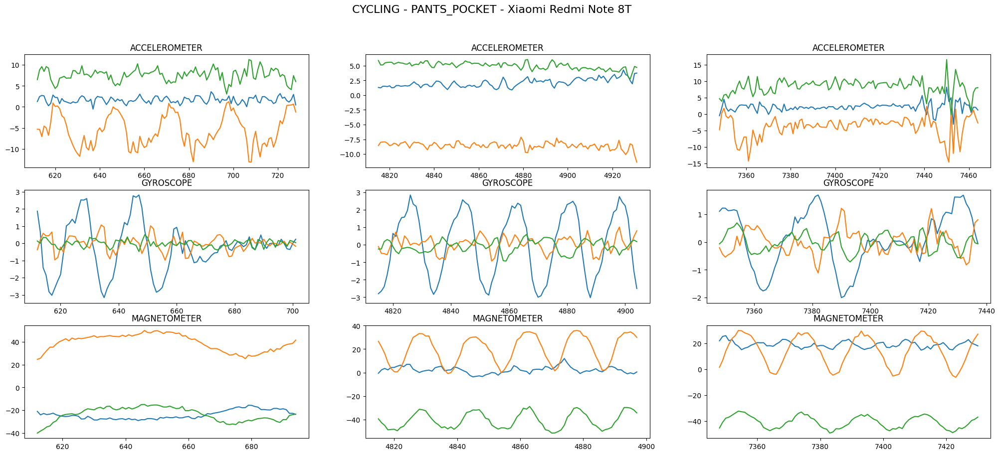

Denys-1678699884536


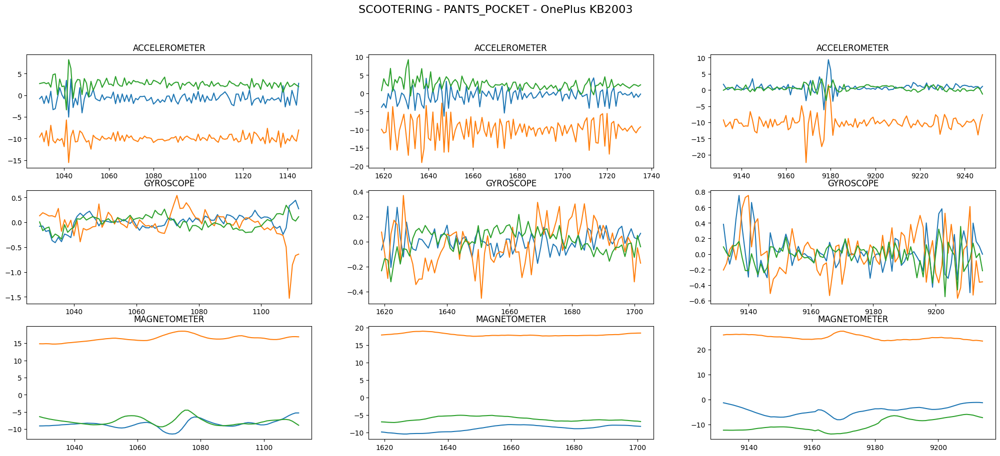

Denys-1678896051574


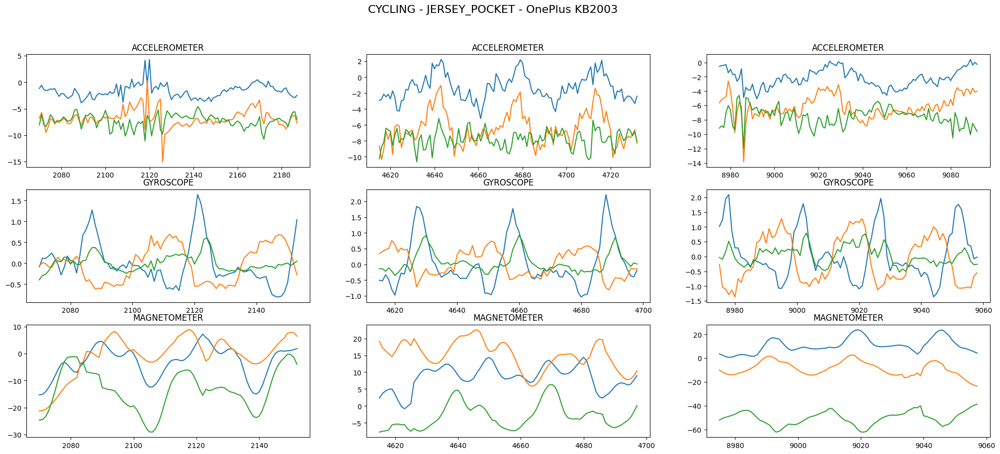

amagross-1678715911301


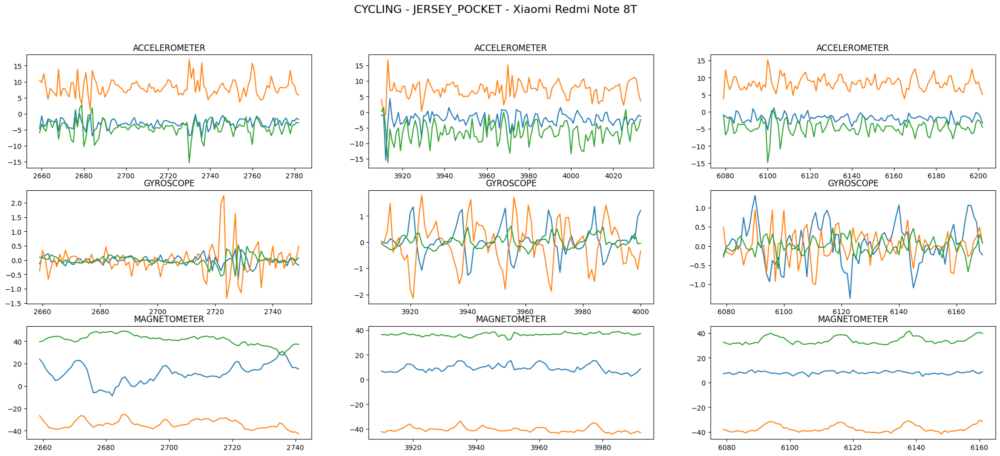

Denys-1678700636644


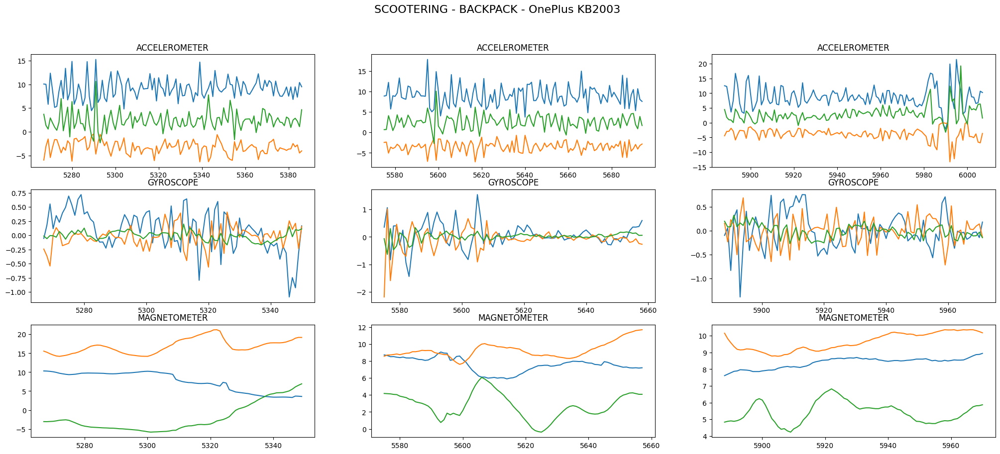

Denys-1678818404111
Denys2-1678895239011


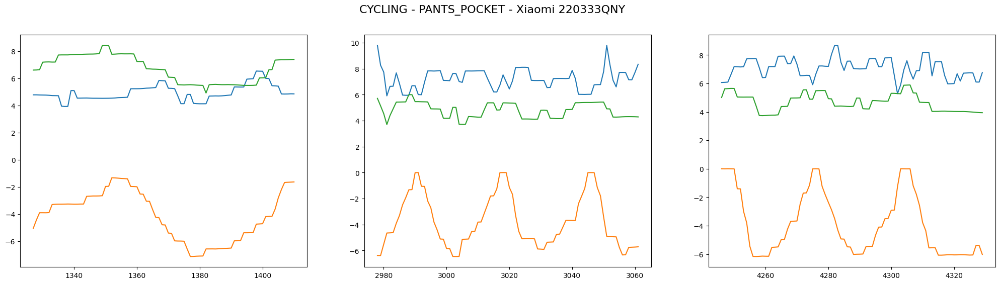

Denys2-1678820936333


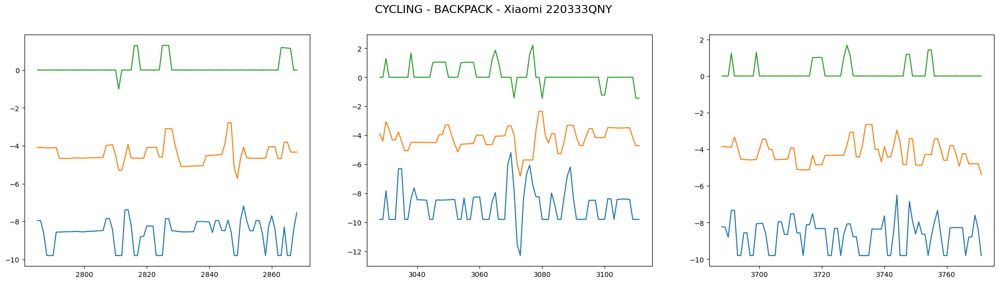

amagross-1678780881300


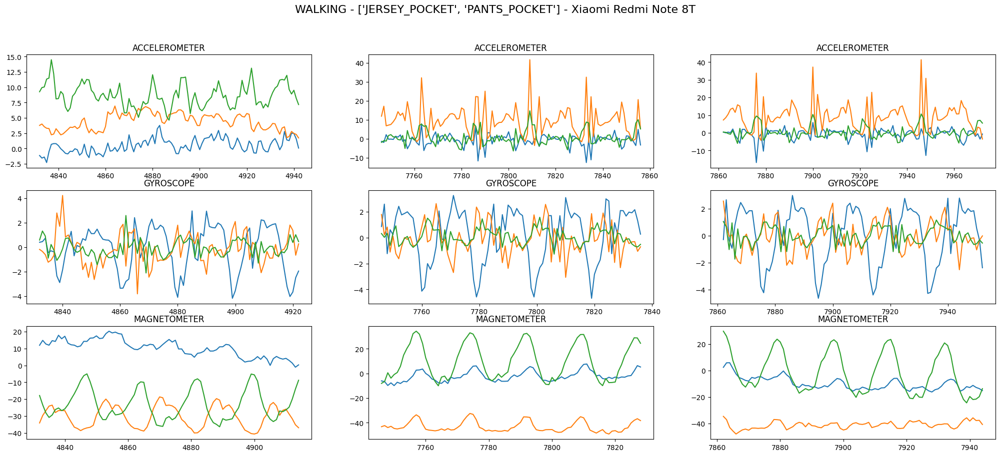

Denys2-1678818417210


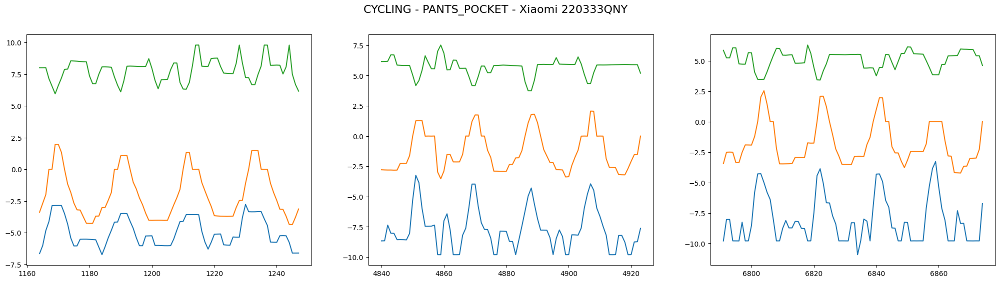

amagross-1678199264626


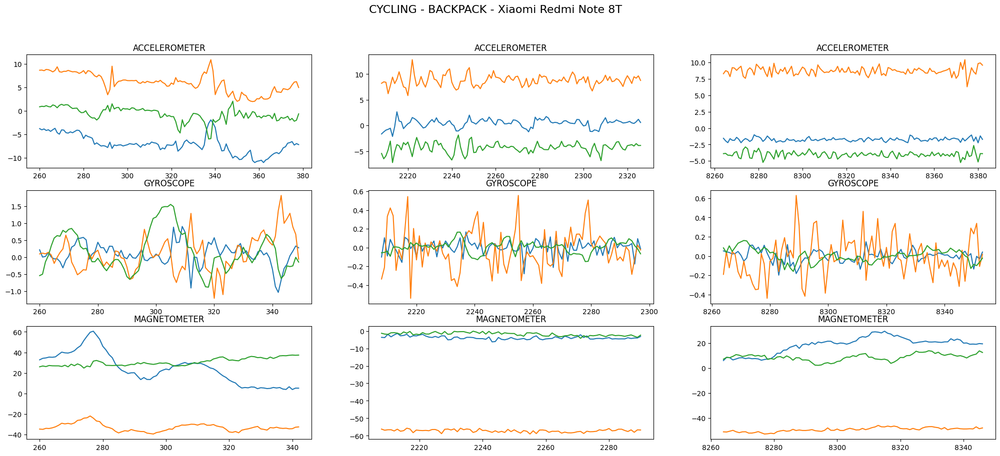

amagross-1678716626903


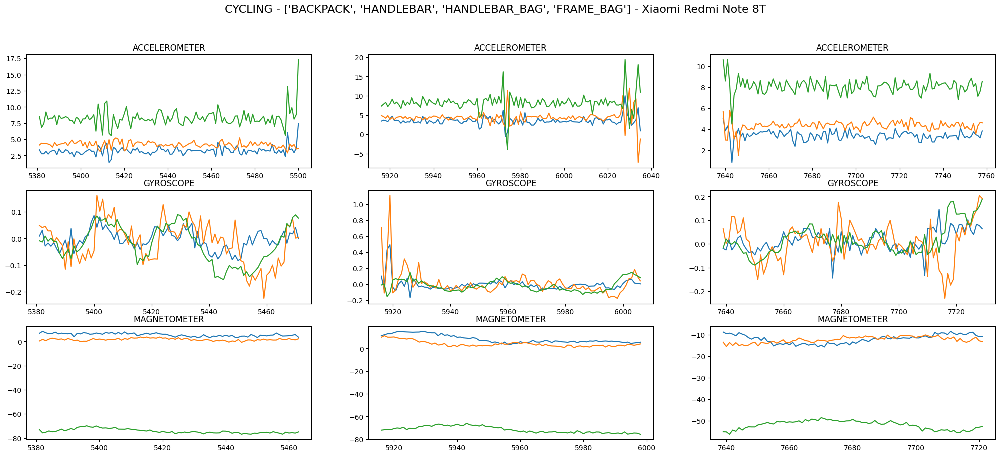

amagross-1678717368281


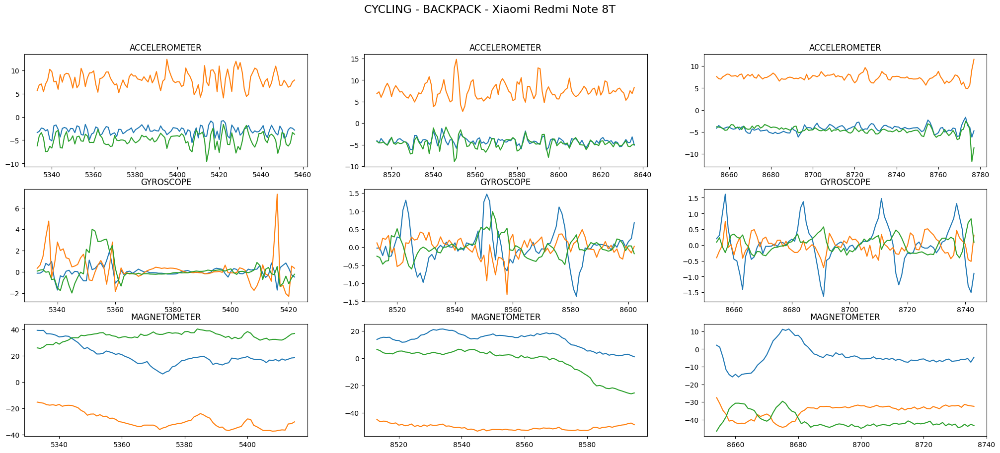

Denys-1678820933838


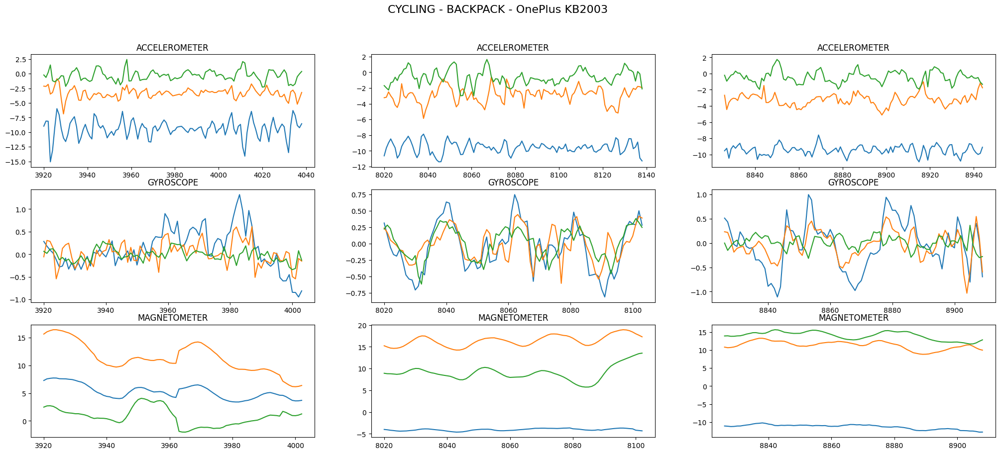

Denys-1678800162825


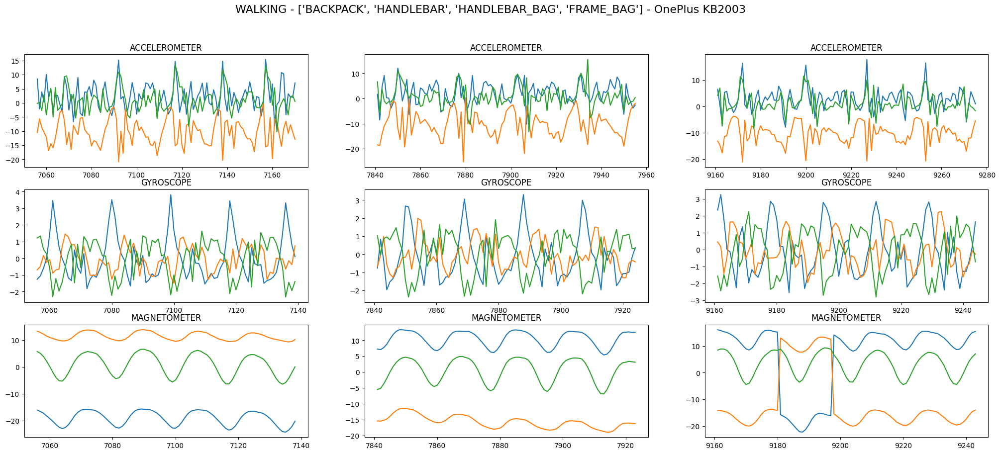

amagross-1678201865645


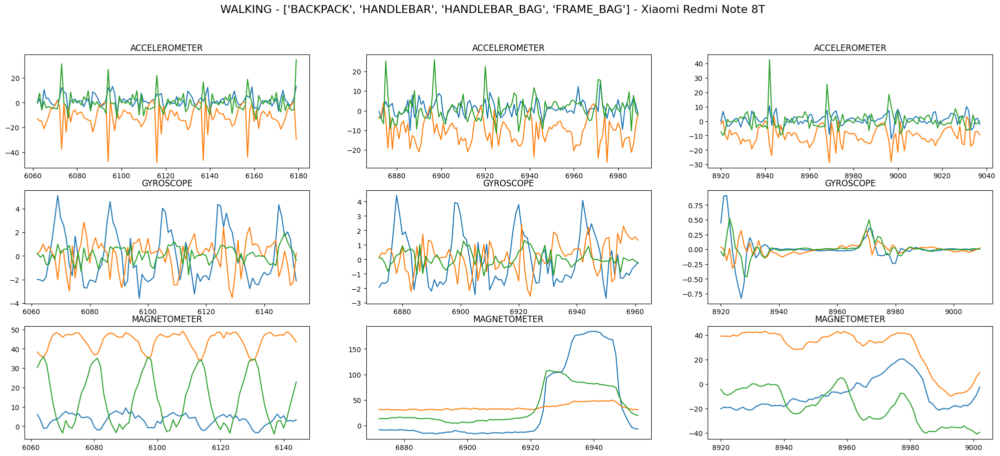

Denys-1678895240206


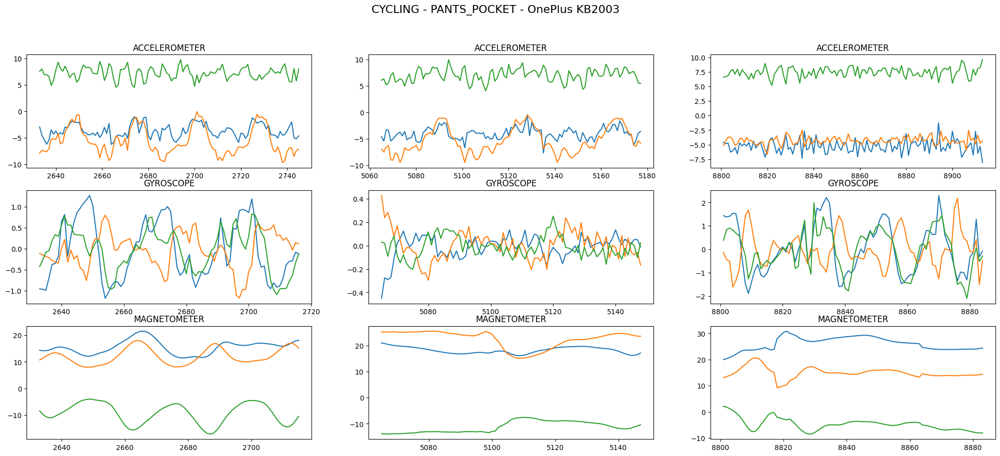

Denys2-1678896048521


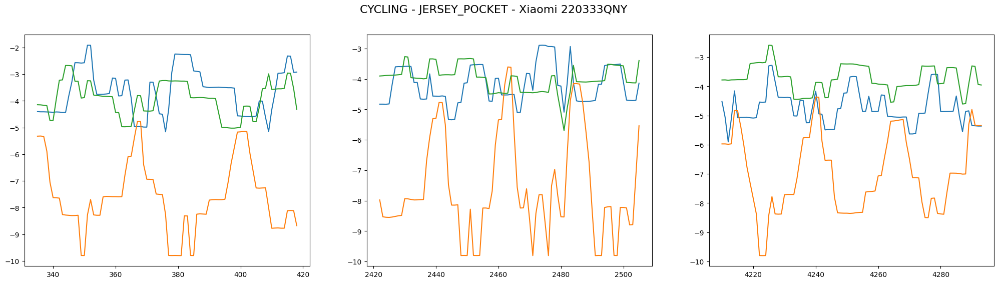

Denys-1678896837582


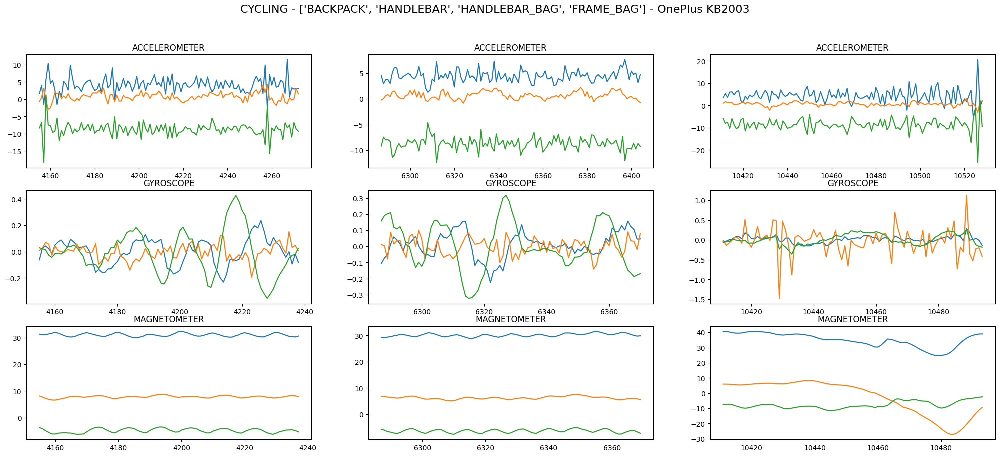

In [11]:
for index, row in summary.iterrows(): 
    curr_sr = SensorReadings(row['session_id'], row['data'], row['activity'], row['position'], row['model'])
    print(row['session_id'])
    curr_sr.get_random_ts_vis()

In [10]:
for index, row in summary.iterrows(): 
    print(row['session_id'])
    print('Aligned and Resampled Data')
    curr_sr = SensorReadings(row['session_id'], row['data'], row['activity'], row['position'], row['model'], use_sensors = ['ACCELEROMETER', 'GYROSCOPE', 'MAGNETOMETER'])
    curr_sr.align()
    curr_sr.resample(desired_freq=33)
    break
#     curr_sr.get_random_ts_vis()
#     print('Delays after alignment')
#     curr_sr.draw_delays()

Denys-1678820143565
Aligned and Resampled Data


In [11]:
stacked = curr_sr.stack()

In [12]:
curr_sr.sample(stacked)

[array([[ -1.59893562,  -8.40970962,  -5.89060259, ...,  -0.9603838 ,
         -40.8755684 ,  31.55887664],
        [ -0.81638193,  -7.78431424,  -5.96678389, ...,  -0.91434906,
         -40.60669511,  31.08022839],
        [ -0.69039155,  -7.73105504,  -6.53712525, ...,  -0.84323028,
         -40.65242381,  30.71309947],
        ...,
        [ -3.82865853,  -8.58252661,  -4.51526039, ...,  10.98949402,
         -30.38346315,  17.59509431],
        [ -3.81648698,  -8.35299542,  -4.56067284, ...,  11.13217249,
         -30.35530561,  17.62090228],
        [ -3.93886393,  -8.31996208,  -4.49441896, ...,  10.9901241 ,
         -30.40668238,  17.51181273]]),
 array([[ -4.12848329,  -8.39768117,  -4.44285583, ...,  10.92866238,
         -30.42599007,  17.48764619],
        [ -4.18584558,  -8.20147257,  -4.43536666, ...,  11.10385172,
         -30.35671103,  17.54272706],
        [ -4.29217099,  -8.25384844,  -4.3650316 , ...,  10.93985614,
         -30.34052715,  17.44940987],
        ...,


# DTW Demo

In [13]:
curr_sr = SensorReadings('amagross-1677843222597',
                         './test_data_new_collection_30hz/amagross-1678197254044-sensor-readings.csv', 
                         'CYCLING', 
                         'PANTS_POCKET', 
                         'Xiaomi Redmi Note 8T', 
                         avg_duplicate_ts=True)

/home/bulat/trdl_ai_exp/dataset/sensor_readings.py:34: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  sensor_data_ts = sensor_data_ts.groupby('timestamp').mean().reset_index()
/home/bulat/trdl_ai_exp/dataset/sensor_readings.py:34: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  sensor_data_ts = sensor_data_ts.groupby('timestamp').mean().reset_index()
/home/bulat/trdl_ai_exp/dataset/sensor_readings.py:34: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should

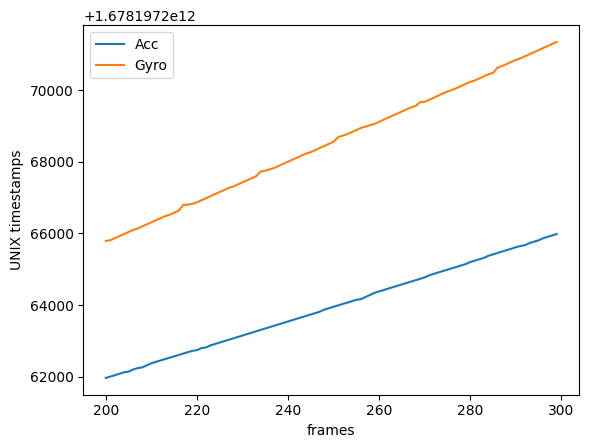

In [14]:
acc_ts = curr_sr.device_data['ACCELEROMETER']['ts']
gyro_ts = curr_sr.device_data['GYROSCOPE']['ts']

plt.plot(acc_ts[200:300], label='Acc')
plt.plot(gyro_ts[200:300], label='Gyro')
plt.legend()
plt.ylabel('UNIX timestamps')
plt.xlabel('frames')
plt.show()

In [15]:
from tslearn.metrics import dtw, dtw_path

# Or, if the path is also an important information:
optimal_path, dtw_score = dtw_path(curr_sr.device_data['GYROSCOPE']['ts'], curr_sr.device_data['ACCELEROMETER']['ts'])

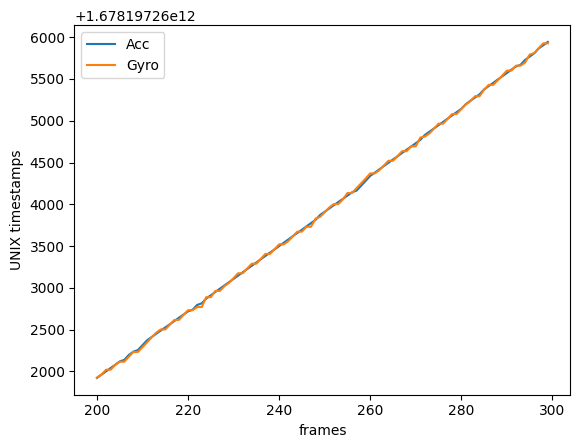

In [16]:
path, _ = dtw_path(np.array(curr_sr.device_data['GYROSCOPE']['ts']).squeeze(), np.array(curr_sr.device_data['ACCELEROMETER']['ts']).squeeze())
aligned_acc_ts = curr_sr.device_data['ACCELEROMETER']['ts'][[x[1] for x in path]].reset_index(drop=True)
aligned_gyro_ts = curr_sr.device_data['GYROSCOPE']['ts'][[x[0] for x in path]].reset_index(drop=True)

plt.plot(aligned_acc_ts[200:300], label='Acc')
plt.plot(aligned_gyro_ts[200:300], label='Gyro')
plt.legend()
plt.ylabel('UNIX timestamps')
plt.xlabel('frames')
plt.show()